# Plotting Nonlinearity results

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing the libraries

%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import xarray as xr
import netCDF4
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [3]:
from scipy import stats

In [4]:
import seaborn as sns

In [5]:
mpl.rcParams['font.family'] = 'Droid Sans'
mpl.rcParams['font.size'] = 12
# Edit axes parameters
mpl.rcParams['axes.linewidth'] = 1.5
# Tick properties
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.direction'] = 'out'

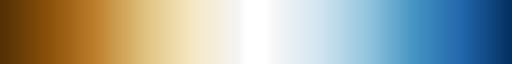

In [6]:
n = 35
diff = 0.5
cmap = plt.cm.BrBG
cmap2 = plt.cm.RdBu
lower = cmap(np.linspace(0, diff, n))
white = np.ones((2, 4))
upper = cmap2(np.linspace(1-diff, 1, n))
colors = np.vstack((lower, white, white, upper))
BrBU = mpl.colors.LinearSegmentedColormap.from_list('map_white', colors)
BrBU

In [7]:
out = xr.open_dataset('./PhD/prelim_tasks/data/result/regional_res.nc')
out

<xarray.Dataset>
Dimensions:        (season: 5, region: 46, model: 32)
Coordinates:
  * season         (season) object 'ann' 'djf' 'mam' 'jja' 'son'
  * region         (region) int64 0 1 2 3 4 5 6 7 8 ... 38 39 40 41 42 43 44 45
  * model          (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
Data variables: (12/15)
    std_dev        (season, region, model) float64 ...
    clim           (season, region, model) float64 ...
    corr_coef      (season, region, model) float64 ...
    pval           (season, region, model) float64 ...
    neut           (season, region, model) float64 ...
    nino           (season, region, model) float64 ...
    ...             ...
    asymm          (season, region, model) float64 ...
    symm           (season, region, model) float64 ...
    ratio          (season, region, model) float64 ...
    symm_contrib   (season, region, model) float64 ...
    asymm_contrib  (season, region, model) float64 ...
    nature         (season, region, model) float64 ...

In [8]:
# plotting code
import matplotlib as m
from matplotlib.colors import BoundaryNorm as BM


def plot_background(ax):
    ax.add_feature(cfeature.COASTLINE, alpha=0.9, lw=1.1)
    ax.set_global()
    # ax.add_feature(cfeature.LAND, color='lightgray')
    # ax.add_feature(cfeature.OCEAN, color='lightgray')
    gl = ax.gridlines(draw_labels=True,
                      linewidth=1, color='gray', alpha=0.01, linestyle='--')
    gl.top_labels = False
    # gl.left_labels = False
    # gl.bottom_labels = False
    gl.right_labels = False
    gl.xlines = False
    # gl.xlocator = mticker.FixedLocator([-180, -45, 0, 45, 180])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 10, 'color': 'k'}
    gl.ylabel_style = {'size': 10, 'color': 'k'}
    return ax

def plot(z, titles, cmap, vmin, vmax, cbar_label = 'Precip', pval = [], pval_mme=[], nrows=1, ncols=3, figsize=(12,4), ocean_mask_list = []):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        for j in range(len(z[i])):
            if pval != [] and pval_mme == []:
                if pval[i][j] > 0.05:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            elif pval == [] and pval_mme != []:
                if pval_mme[i][j] < 0.51:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i])
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), ax = axlist, \
                orientation = 'vertical', shrink=0.7, aspect = 20, pad = 0.01, label = cbar_label)

In [9]:
import seaborn as sns

In [10]:
import regionmask

In [11]:
region_names = regionmask.defined_regions.ar6.land.to_dataframe()['names'].to_numpy()
region_names

array(['Greenland/Iceland', 'N.W.North-America', 'N.E.North-America',
       'W.North-America', 'C.North-America', 'E.North-America',
       'N.Central-America', 'S.Central-America', 'Caribbean',
       'N.W.South-America', 'N.South-America', 'N.E.South-America',
       'South-American-Monsoon', 'S.W.South-America', 'S.E.South-America',
       'S.South-America', 'N.Europe', 'West&Central-Europe', 'E.Europe',
       'Mediterranean', 'Sahara', 'Western-Africa', 'Central-Africa',
       'N.Eastern-Africa', 'S.Eastern-Africa', 'W.Southern-Africa',
       'E.Southern-Africa', 'Madagascar', 'Russian-Arctic', 'W.Siberia',
       'E.Siberia', 'Russian-Far-East', 'W.C.Asia', 'E.C.Asia',
       'Tibetan-Plateau', 'E.Asia', 'Arabian-Peninsula', 'S.Asia',
       'S.E.Asia', 'N.Australia', 'C.Australia', 'E.Australia',
       'S.Australia', 'New-Zealand', 'E.Antarctica', 'W.Antarctica'],
      dtype=object)

In [12]:
save_loc = './PhD/prelim_tasks/images/regional/'

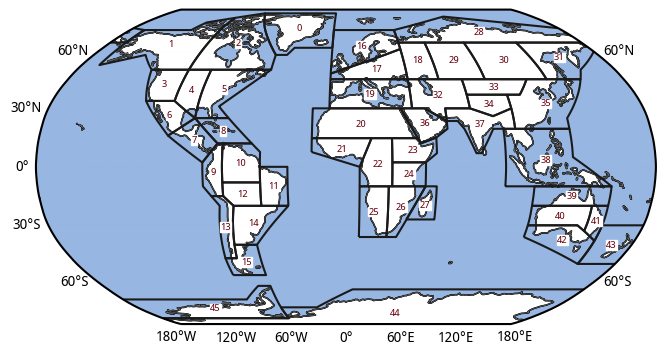

In [13]:
fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection = ccrs.Robinson())
ax.coastlines()
plot_background(ax)
text_kws = dict(color="#67000d", fontsize=7, bbox=dict(pad=0.2, color="w"))
regionmask.defined_regions.ar6.land.plot(text_kws=text_kws, add_ocean=True)
plt.savefig(save_loc+'regions.png', dpi=300, bbox_inches='tight')

#### clim

In [295]:
clim_list = [out.isel(season = 0, model = -1).clim,
             out.isel(season = 1, model = -1).clim,
             out.isel(season = 2, model = -1).clim,
             out.isel(season = 3, model = -1).clim,
             out.isel(season = 4, model = -1).clim]

In [296]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

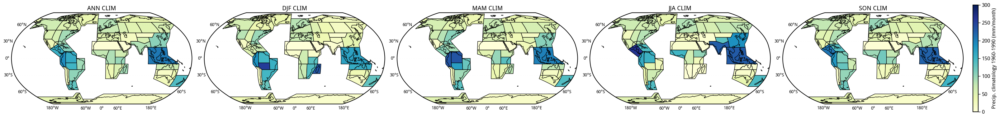

In [297]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_clim.png', dpi=300, bbox_inches='tight')

#### std

In [298]:
std_list = [out.isel(season = 0, model = -1).std_dev,
             out.isel(season = 1, model = -1).std_dev,
             out.isel(season = 2, model = -1).std_dev,
             out.isel(season = 3, model = -1).std_dev,
             out.isel(season = 4, model = -1).std_dev]

In [299]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

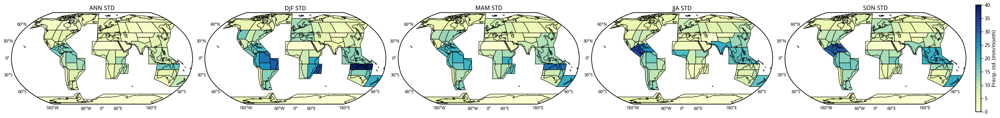

In [300]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=40, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_std.png', dpi=300, bbox_inches='tight')

#### corr

In [301]:
corr_list = [out.isel(season = 0, model = -1).corr_coef,
             out.isel(season = 1, model = -1).corr_coef,
             out.isel(season = 2, model = -1).corr_coef,
             out.isel(season = 3, model = -1).corr_coef,
             out.isel(season = 4, model = -1).corr_coef]

In [302]:
pval_list = [out.isel(season = 0, model = -1).pval, 
             out.isel(season = 1, model = -1).pval,
             out.isel(season = 2, model = -1).pval,
             out.isel(season = 3, model = -1).pval,
             out.isel(season = 4, model = -1).pval]

In [303]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

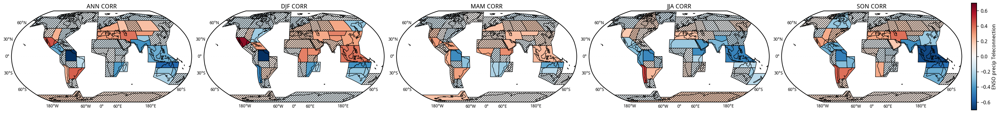

In [304]:
plot(corr_list, title_list, mpl.cm.RdBu_r, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_corr.png', dpi=300, bbox_inches='tight')

#### nino state

In [305]:
plot_list = [((out.isel(season = 0, model = -1).nino/out.isel(season = 0, model = -1).clim)*100), 
             ((out.isel(season = 1, model = -1).nino/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).nino/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).nino/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).nino/out.isel(season = 4, model = -1).clim)*100),
             ((out.isel(season = 0, model = -1).nina/out.isel(season = 0, model = -1).clim)*100),
             ((out.isel(season = 1, model = -1).nina/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).nina/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).nina/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).nina/out.isel(season = 4, model = -1).clim)*100),
             ((out.isel(season = 0, model = -1).neut/out.isel(season = 0, model = -1).clim)*100),
             ((out.isel(season = 1, model = -1).neut/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).neut/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).neut/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).neut/out.isel(season = 4, model = -1).clim)*100)]

In [306]:
pval_list = [out.isel(season = 0, model = -1).pval.to_numpy(), 
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy(),
             out.isel(season = 0, model = -1).pval.to_numpy(),
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy(),
             out.isel(season = 0, model = -1).pval.to_numpy(),
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy()]

In [307]:
title_list = ['ANN NINO', 'DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'ANN NINA', 'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'ANN NEUT', 'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

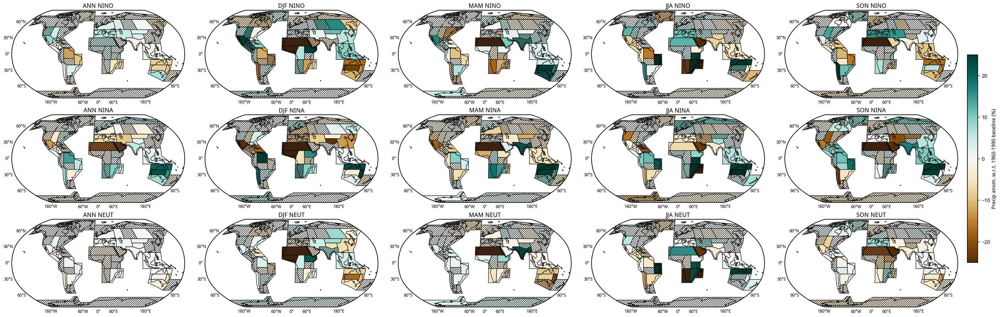

In [308]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-25, vmax=25, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=3, ncols=5, figsize=(32,10), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_enso_state.png', dpi=300, bbox_inches='tight')

#### nino change

In [309]:
plot_list = [((out.isel(season = 0, model = -1).enc/out.isel(season = 0, model = -1).clim)*100), 
             ((out.isel(season = 1, model = -1).enc/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).enc/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).enc/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).enc/out.isel(season = 4, model = -1).clim)*100),
             ((out.isel(season = 0, model = -1).lnc/out.isel(season = 0, model = -1).clim)*100),
             ((out.isel(season = 1, model = -1).lnc/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).lnc/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).lnc/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).lnc/out.isel(season = 4, model = -1).clim)*100)]

In [310]:
pval_list = [out.isel(season = 0, model = -1).pval.to_numpy(), 
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy(),
             out.isel(season = 0, model = -1).pval.to_numpy(),
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy()]

In [311]:
title_list = ['ANN ENC', 'DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'ANN LNC', 'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

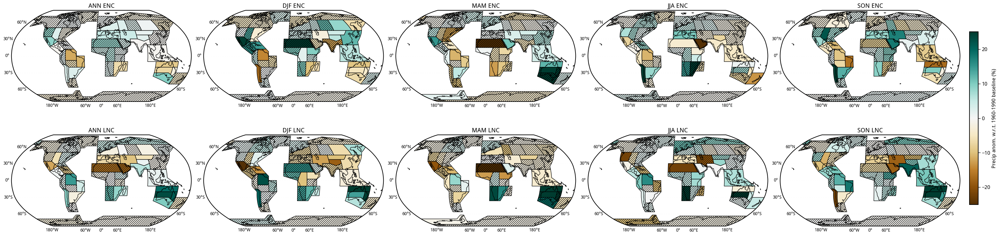

In [312]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-25, vmax=25, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_enso_change.png', dpi=300, bbox_inches='tight')

#### asymm and symm

In [313]:
plot_list = [((out.isel(season = 0, model = -1).asymm/out.isel(season = 0, model = -1).clim)*100), 
             ((out.isel(season = 1, model = -1).asymm/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).asymm/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).asymm/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).asymm/out.isel(season = 4, model = -1).clim)*100),
             ((out.isel(season = 0, model = -1).symm/out.isel(season = 0, model = -1).clim)*100),
             ((out.isel(season = 1, model = -1).symm/out.isel(season = 1, model = -1).clim)*100),
             ((out.isel(season = 2, model = -1).symm/out.isel(season = 2, model = -1).clim)*100),
             ((out.isel(season = 3, model = -1).symm/out.isel(season = 3, model = -1).clim)*100),
             ((out.isel(season = 4, model = -1).symm/out.isel(season = 4, model = -1).clim)*100)]

In [314]:
pval_list = [out.isel(season = 0, model = -1).pval.to_numpy(), 
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy(),
             out.isel(season = 0, model = -1).pval.to_numpy(),
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy()]

In [315]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

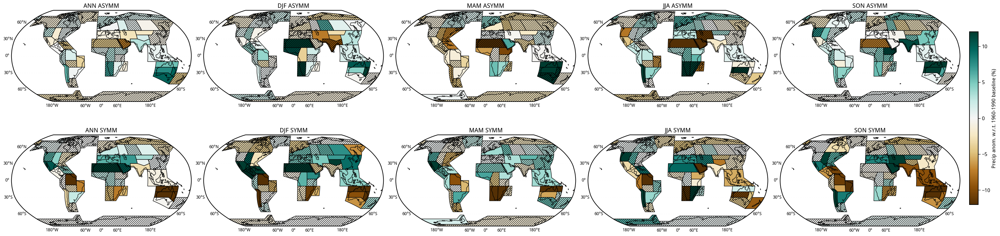

In [316]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-12, vmax=12, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/rean_asymm_symm.png', dpi=300, bbox_inches='tight')

#### asymm and symm contrib

In [250]:
plot_list = [out.isel(season = 0, model = -2).asymm_contrib*100,
             out.isel(season = 1, model = -2).asymm_contrib*100,
             out.isel(season = 2, model = -2).asymm_contrib*100,
             out.isel(season = 3, model = -2).asymm_contrib*100,
             out.isel(season = 4, model = -2).asymm_contrib*100,
             out.isel(season = 0, model = -2).symm_contrib*100,
             out.isel(season = 1, model = -2).symm_contrib*100,
             out.isel(season = 2, model = -2).symm_contrib*100,
             out.isel(season = 3, model = -2).symm_contrib*100,
             out.isel(season = 4, model = -2).symm_contrib*100]

In [251]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

In [252]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

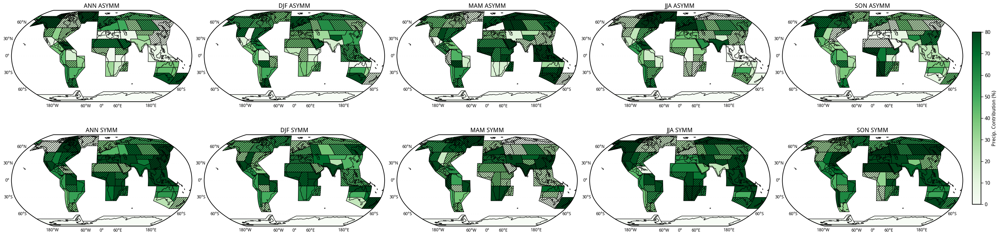

In [253]:
plot(plot_list, title_list, mpl.cm.Greens, vmin=0, vmax=80, cbar_label = 'Precip. Contribution (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/obs_asymm_symm_contrib.png', dpi=300, bbox_inches='tight')

#### Relative Asymm component

In [12]:
plot_list = [out.isel(season = 0, model = -1).ratio,
             out.isel(season = 1, model = -1).ratio,
             out.isel(season = 2, model = -1).ratio,
             out.isel(season = 3, model = -1).ratio,
             out.isel(season = 4, model = -1).ratio]

In [13]:
pval_list = [out.isel(season = 0, model = -1).pval.to_numpy(), 
             out.isel(season = 1, model = -1).pval.to_numpy(),
             out.isel(season = 2, model = -1).pval.to_numpy(),
             out.isel(season = 3, model = -1).pval.to_numpy(),
             out.isel(season = 4, model = -1).pval.to_numpy()]

In [14]:
title_list = ['ANN', 'DJF', 'MAM', 'JJA', 'SON']

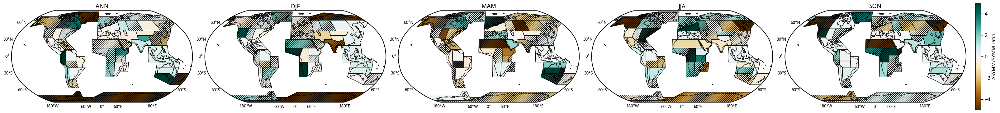

In [16]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-5, vmax=5, cbar_label = 'ASYMM/SYMM ratio', pval = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 15, 1))
# plt.savefig('./PhD/prelim_tasks/images/regional/rean_asymm_symm_ratio.png', dpi=300, bbox_inches='tight')

In [13]:
import os
model_list = sorted(os.listdir('/scratch/ob22/as8561/data/proc/'))[1:]

In [14]:
model_list

['ACCESS-CM2',
 'ACCESS-ESM1-5',
 'AWI-CM-1-1-MR',
 'CESM2',
 'CESM2-WACCM',
 'CMCC-CM2-SR5',
 'CNRM-CM6-1',
 'CNRM-CM6-1-HR',
 'CNRM-ESM2-1',
 'CanESM5',
 'E3SM-1-1',
 'EC-Earth3',
 'EC-Earth3-Veg-LR',
 'FIO-ESM-2-0',
 'GFDL-CM4',
 'GFDL-ESM4',
 'INM-CM4-8',
 'INM-CM5-0',
 'IPSL-CM6A-LR',
 'KACE-1-0-G',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM1-2-HR',
 'MPI-ESM1-2-LR',
 'MRI-ESM2-0',
 'NESM3',
 'NorESM2-LM',
 'NorESM2-MM',
 'TaiESM1',
 'UKESM1-0-LL',
 'obs',
 'rean']

In [15]:
model_colors = ['tab:red', 'red', 'tab:brown', 'tab:blue', 'blue', 'tab:green', 'darkgreen', 'limegreen', \
                'lightgreen', 'teal', 'darkviolet', 'violet', 'purple', 'deeppink', 'tab:orange', 'yellow', \
                'gold', 'lightsalmon', 'sandybrown', 'goldenrod', 'maroon', 'darkred', 'skyblue', 'steelblue', \
                'indigo', 'pink', 'hotpink', 'navy', 'midnightblue', 'darkslateblue', 'k', 'tab:blue']

In [16]:
len(model_colors)

32

In [17]:
region_names[-7]

'N.Australia'

In [18]:
na = out.isel(region=-7)

In [19]:
str(na.model[0].values)

'ACCESS-CM2'

In [38]:
na.isel(season = 3, model = -2).clim.values

array(4.46832081)

In [20]:
def plot_scatter(da, var, no_clim = False):
    if no_clim == False:
        for j in range(len(da.model)):
            clim = da.isel(model = j).clim
            if da.model[j] == 'obs' or da.model[j] == 'rean':
                ((da.isel(model = j)[var]/clim)*100).plot.scatter(color = model_colors[j], marker = 'D', alpha = 1.0, s = 90, facecolor='white', label = model_list[j])
            else:
                ((da.isel(model = j)[var]/clim)*100).plot.scatter(color = model_colors[j], marker = 'o', alpha = 0.6, s = 10, facecolor='white', label = model_list[j])
        ((da.isel(model = slice(0, -2))[var]/da.isel(model = slice(0, -2)).clim)*100).mean('model').plot.scatter(color = 'tab:red', marker='D', alpha = 0.9, s = 80, facecolor='white', label = 'mme')
    else:
        for j in range(len(da.model)):
            if da.model[j] == 'obs' or da.model[j] == 'rean':
                (da.isel(model = j)[var]).plot.scatter(color = model_colors[j], marker = 'D', alpha = 0.9, s = 80, facecolor='white', label = model_list[j])
            else:
                (da.isel(model = j)[var]).plot.scatter(color = model_colors[j], marker = 'o', alpha = 0.4, s = 10, facecolor='white', label = model_list[j])
        (da.isel(model = slice(0, -2))[var]).mean('model').plot.scatter(color = 'tab:red', marker='D', alpha = 0.9, s = 80, facecolor='white', label = 'mme')

In [21]:
sa = out.isel(region = -9)
region_names[-9]

'S.Asia'

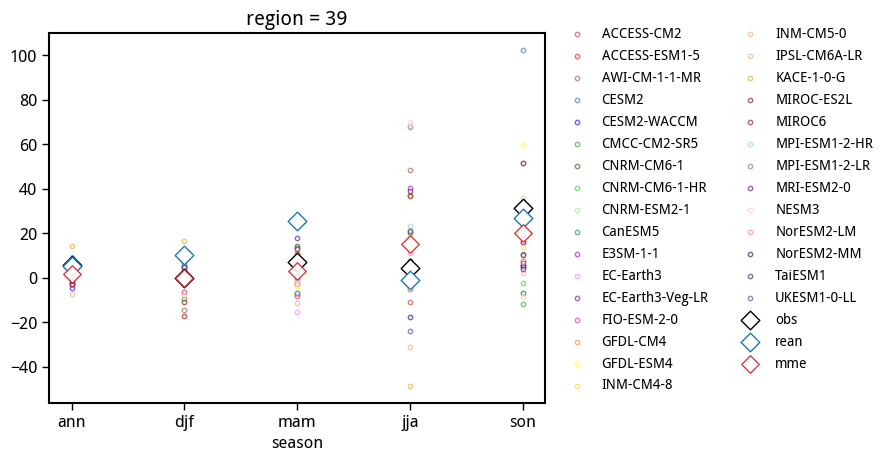

In [32]:
plot_scatter(na, 'asymm', no_clim=False)
plt.legend(frameon=False, ncol=2,  fontsize = 10, bbox_to_anchor = [1.01, 1.05])
# plt.ylim(-1.0, 2.0)
plt.savefig('./PhD/prelim_tasks/images/regional/naus_asymm_scatter.png', dpi=300, bbox_inches='tight')

### creating mme dataset

In [22]:
def get_sig1d(x):
    sig_models = len(x[x < 0.05])
    return float(sig_models/32)


def get_sign3d(da, dim):
    return xr.apply_ufunc(get_sig1d, da, input_core_dims=[[dim]], vectorize=True, dask='parallelized')

In [23]:
mme_ds = out.drop(['pval']).mean('model')

In [24]:
mme_ds['sign_ratio'] = get_sign3d(out.pval, dim='model')

In [25]:
mme_ds

<xarray.Dataset>
Dimensions:        (season: 5, region: 46)
Coordinates:
  * season         (season) object 'ann' 'djf' 'mam' 'jja' 'son'
  * region         (region) int64 0 1 2 3 4 5 6 7 8 ... 38 39 40 41 42 43 44 45
Data variables: (12/15)
    std_dev        (season, region) float64 2.97 2.503 2.15 ... 20.3 1.142 5.538
    clim           (season, region) float64 33.22 58.61 47.5 ... 10.45 35.12
    corr_coef      (season, region) float64 0.04315 -0.2338 ... 0.05513 0.02671
    neut           (season, region) float64 0.09752 0.1952 ... -0.0744 -0.03213
    nino           (season, region) float64 0.008085 -0.7182 ... -0.0562 0.4153
    nina           (season, region) float64 -0.4258 0.7618 ... -0.1314 -0.3291
    ...             ...
    symm           (season, region) float64 0.217 -0.74 ... 0.03757 0.3722
    ratio          (season, region) float64 -1.115 -1.7 1.426 ... -0.8549 0.6264
    symm_contrib   (season, region) float64 0.3818 0.5344 ... 0.3906 0.5039
    asymm_contrib  (season, region) float64 0.6182 0.4656 ... 0.5781 0.4648
    nature         (season, region) float64 0.1875 -0.0625 ... 0.03125 0.2188
    sign_ratio     (season, region) float64 0.09375 0.5938 0.2188 ... 0.0 0.1562

#### clim

In [134]:
clim_list = [mme_ds.isel(season = 0).clim,
             mme_ds.isel(season = 1).clim,
             mme_ds.isel(season = 2).clim,
             mme_ds.isel(season = 3).clim,
             mme_ds.isel(season = 4).clim]

In [135]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

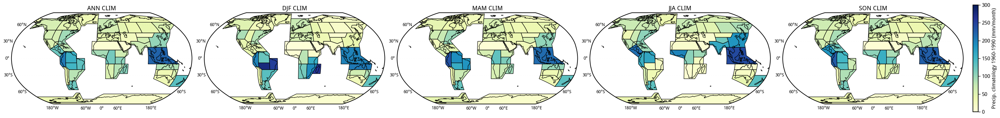

In [136]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_clim.png', dpi=300, bbox_inches='tight')

#### std

In [138]:
std_list = [mme_ds.isel(season = 0).std_dev,
            mme_ds.isel(season = 1).std_dev,
            mme_ds.isel(season = 2).std_dev,
            mme_ds.isel(season = 3).std_dev,
            mme_ds.isel(season = 4).std_dev]

In [139]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

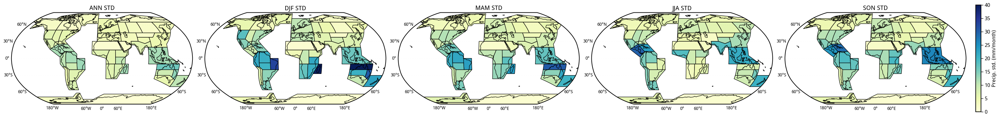

In [140]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=40, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_std.png', dpi=300, bbox_inches='tight')

#### corr

In [142]:
corr_list = [mme_ds.isel(season = 0).corr_coef,
             mme_ds.isel(season = 1).corr_coef,
             mme_ds.isel(season = 2).corr_coef,
             mme_ds.isel(season = 3).corr_coef,
             mme_ds.isel(season = 4).corr_coef]

In [143]:
pval_list = [mme_ds.isel(season = 0).sign_ratio, 
             mme_ds.isel(season = 1).sign_ratio,
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio]

In [144]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

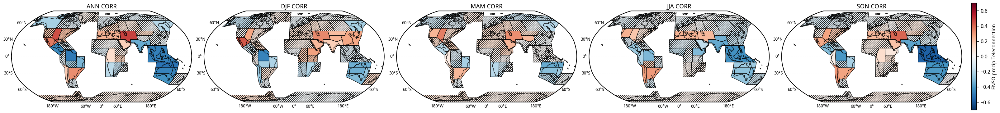

In [148]:
plot(corr_list, title_list, mpl.cm.RdBu_r, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval_mme = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_corr.png', dpi=300, bbox_inches='tight')

#### nino state

In [149]:
plot_list = [((mme_ds.isel(season = 0).nino/mme_ds.isel(season = 0).clim)*100), 
             ((mme_ds.isel(season = 1).nino/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).nino/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).nino/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).nino/mme_ds.isel(season = 4).clim)*100),
             ((mme_ds.isel(season = 0).nina/mme_ds.isel(season = 0).clim)*100),
             ((mme_ds.isel(season = 1).nina/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).nina/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).nina/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).nina/mme_ds.isel(season = 4).clim)*100),
             ((mme_ds.isel(season = 0).neut/mme_ds.isel(season = 0).clim)*100),
             ((mme_ds.isel(season = 1).neut/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).neut/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).neut/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).neut/mme_ds.isel(season = 4).clim)*100)]

In [150]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [151]:
title_list = ['ANN NINO', 'DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'ANN NINA', 'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'ANN NEUT', 'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

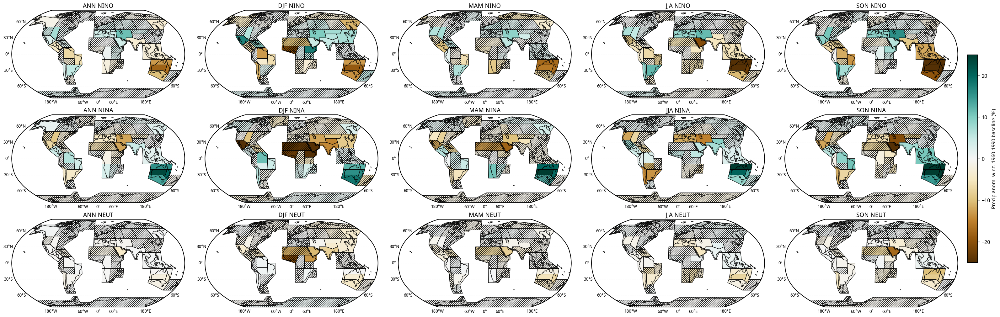

In [152]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-25, vmax=25, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=3, ncols=5, figsize=(32,10), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_enso_state.png', dpi=300, bbox_inches='tight')

#### nino change

In [153]:
plot_list = [((mme_ds.isel(season = 0).enc/mme_ds.isel(season = 0).clim)*100), 
             ((mme_ds.isel(season = 1).enc/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).enc/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).enc/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).enc/mme_ds.isel(season = 4).clim)*100),
             ((mme_ds.isel(season = 0).lnc/mme_ds.isel(season = 0).clim)*100),
             ((mme_ds.isel(season = 1).lnc/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).lnc/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).lnc/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).lnc/mme_ds.isel(season = 4).clim)*100)]

In [154]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [155]:
title_list = ['ANN ENC', 'DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'ANN LNC', 'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

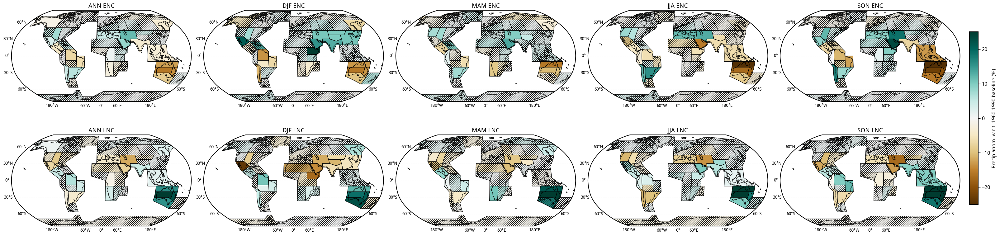

In [156]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-25, vmax=25, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_enso_change.png', dpi=300, bbox_inches='tight')

#### asymm and symm

In [171]:
plot_list = [((mme_ds.isel(season = 0).asymm/mme_ds.isel(season = 0).clim)*100), 
             ((mme_ds.isel(season = 1).asymm/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).asymm/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).asymm/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).asymm/mme_ds.isel(season = 4).clim)*100),
             ((mme_ds.isel(season = 0).symm/mme_ds.isel(season = 0).clim)*100),
             ((mme_ds.isel(season = 1).symm/mme_ds.isel(season = 1).clim)*100),
             ((mme_ds.isel(season = 2).symm/mme_ds.isel(season = 2).clim)*100),
             ((mme_ds.isel(season = 3).symm/mme_ds.isel(season = 3).clim)*100),
             ((mme_ds.isel(season = 4).symm/mme_ds.isel(season = 4).clim)*100)]

In [172]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [173]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

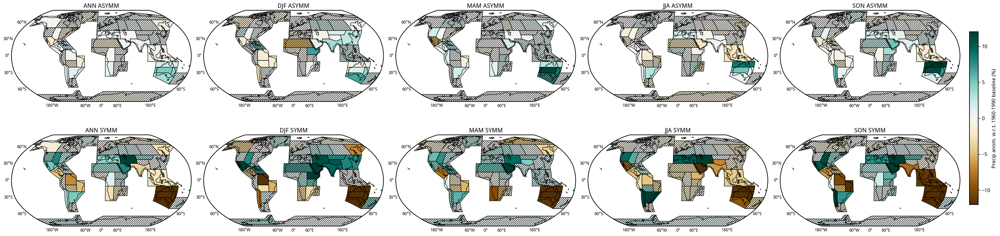

In [174]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-12, vmax=12, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/mme_asymm_symm.png', dpi=300, bbox_inches='tight')

In [250]:
plot_list = [out.isel(season = 0, model = -2).asymm_contrib*100,
             out.isel(season = 1, model = -2).asymm_contrib*100,
             out.isel(season = 2, model = -2).asymm_contrib*100,
             out.isel(season = 3, model = -2).asymm_contrib*100,
             out.isel(season = 4, model = -2).asymm_contrib*100,
             out.isel(season = 0, model = -2).symm_contrib*100,
             out.isel(season = 1, model = -2).symm_contrib*100,
             out.isel(season = 2, model = -2).symm_contrib*100,
             out.isel(season = 3, model = -2).symm_contrib*100,
             out.isel(season = 4, model = -2).symm_contrib*100]

In [251]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

In [252]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

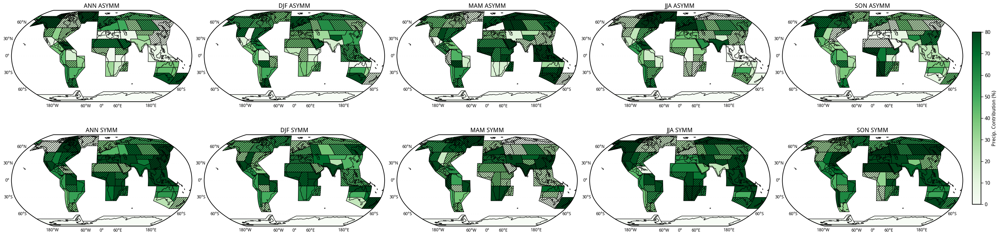

In [253]:
plot(plot_list, title_list, mpl.cm.Greens, vmin=0, vmax=80, cbar_label = 'Precip. Contribution (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig('./PhD/prelim_tasks/images/regional/obs_asymm_symm_contrib.png', dpi=300, bbox_inches='tight')

#### Relative Asymm component

In [175]:
plot_list = [mme_ds.isel(season = 0).ratio,
             mme_ds.isel(season = 1).ratio,
             mme_ds.isel(season = 2).ratio,
             mme_ds.isel(season = 3).ratio,
             mme_ds.isel(season = 4).ratio]

In [176]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [177]:
title_list = ['ANN', 'DJF', 'MAM', 'JJA', 'SON']

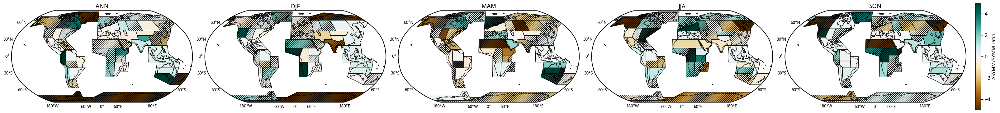

In [16]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-5, vmax=5, cbar_label = 'ASYMM/SYMM ratio', pval = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 15, 1))
# plt.savefig('./PhD/prelim_tasks/images/regional/rean_asymm_symm_ratio.png', dpi=300, bbox_inches='tight')

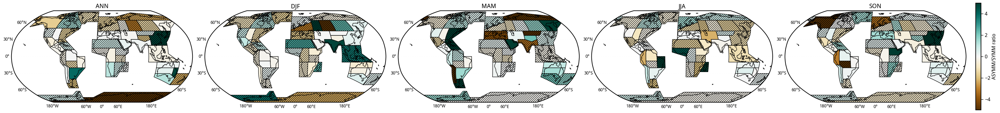

In [178]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-5, vmax=5, cbar_label = 'ASYMM/SYMM ratio', pval_mme = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 15, 1))
# plt.savefig('./PhD/prelim_tasks/images/regional/mme_asymm_symm_ratio.png', dpi=300, bbox_inches='tight')

In [26]:
mme_df = mme_ds.to_dataframe()

In [27]:
obs_df = out.isel(model = -2).to_dataframe()

In [28]:
def fix_df(df):
    df['season'] = [i[0] for i in df.index]
    df['region'] = [i[1] for i in df.index]
    df.set_index(np.arange(0,230, 1), inplace=True)
    return df

In [29]:
mme_df = fix_df(mme_df)
obs_df = fix_df(obs_df)

In [30]:
mme_df['model'] = ['mme']*230

In [31]:
mme_df

,std_dev,clim,corr_coef,neut,nino,nina,enc,lnc,asymm,symm,ratio,symm_contrib,asymm_contrib,nature,sign_ratio,season,region,model
0,2.969750,33.218508,0.043153,0.097524,0.008085,-0.425842,-0.089438,-0.523365,-0.306402,0.216964,-1.115087,0.381790,0.618210,0.18750,0.09375,ann,0,mme
1,2.503485,58.611805,-0.233805,0.195188,-0.718208,0.761780,-0.913396,0.566592,-0.173402,-0.739994,-1.700125,0.534393,0.465607,-0.06250,0.59375,ann,1,mme
2,2.150295,47.497726,-0.084652,0.010348,-0.117483,0.385792,-0.127831,0.375443,0.123806,-0.251637,1.425940,0.468601,0.531399,0.06250,0.21875,ann,2,mme
3,6.559742,61.023019,0.181026,-0.489410,2.252457,-2.538401,2.741868,-2.048991,0.346438,2.395429,0.287739,0.640338,0.359662,0.31250,0.46875,ann,3,mme
4,6.072821,60.014153,0.448864,-0.131321,4.405327,-5.445162,4.536647,-5.313841,-0.388597,4.925244,-0.031723,0.794948,0.205052,-0.18750,0.93750,ann,4,mme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,18.511372,47.122537,-0.411202,-3.132815,-12.469959,13.047598,-9.337144,16.180413,3.421634,-12.758778,0.344001,0.689181,0.310819,-0.43750,0.87500,son,41,mme
226,7.680130,28.538331,-0.385398,-1.099324,-5.584036,4.191514,-4.484712,5.290839,0.403063,-4.887775,0.130685,0.766265,0.233735,-0.25000,0.84375,son,42,mme
227,20.296979,142.360303,0.001706,0.185320,1.335712,-2.762897,1.150392,-2.948217,-0.898913,2.049304,-1.269302,0.514586,0.485414,0.12500,0.21875,son,43,mme
228,1.141975,10.452927,0.055134,-0.074403,-0.056204,-0.131353,0.018198,-0.056951,-0.019376,0.037575,-0.854904,0.390636,0.578114,0.03125,0.00000,son,44,mme


In [32]:
import pandas as pd

In [33]:
stack = pd.concat([obs_df, mme_df], axis=0)
stack

,model,std_dev,clim,corr_coef,pval,neut,nino,nina,enc,lnc,asymm,symm,ratio,symm_contrib,asymm_contrib,nature,season,region,sign_ratio
0,obs,2.353148,28.443272,0.013878,0.882457,0.053753,-1.188026,-0.985968,-1.241780,-1.039722,-1.140751,-0.101029,-11.291306,0.081358,0.918642,1.00000,ann,0,NaN
1,obs,1.935306,46.013702,-0.030377,0.746163,0.214099,-1.391951,-1.223754,-1.606050,-1.437852,-1.521951,-0.084099,-18.097198,0.052364,0.947636,1.00000,ann,1,NaN
2,obs,1.623080,40.055971,-0.072049,0.442141,0.063723,-0.368611,0.352493,-0.432334,0.288769,-0.071782,-0.360552,-0.199091,0.833965,0.166035,1.00000,ann,2,NaN
3,obs,5.439566,46.579936,0.026348,0.778898,-0.656147,-0.104641,-3.289782,0.551506,-2.633635,-1.041065,1.592570,-0.653701,0.604704,0.395296,-1.00000,ann,3,NaN
4,obs,6.101428,57.559937,0.360743,0.000069,0.768908,2.781742,-5.582579,2.012833,-6.351488,-2.169327,4.182160,-0.518710,0.658454,0.341546,-1.00000,ann,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,mme,18.511372,47.122537,-0.411202,NaN,-3.132815,-12.469959,13.047598,-9.337144,16.180413,3.421634,-12.758778,0.344001,0.689181,0.310819,-0.43750,son,41,0.87500
226,mme,7.680130,28.538331,-0.385398,NaN,-1.099324,-5.584036,4.191514,-4.484712,5.290839,0.403063,-4.887775,0.130685,0.766265,0.233735,-0.25000,son,42,0.84375
227,mme,20.296979,142.360303,0.001706,NaN,0.185320,1.335712,-2.762897,1.150392,-2.948217,-0.898913,2.049304,-1.269302,0.514586,0.485414,0.12500,son,43,0.21875
228,mme,1.141975,10.452927,0.055134,NaN,-0.074403,-0.056204,-0.131353,0.018198,-0.056951,-0.019376,0.037575,-0.854904,0.390636,0.578114,0.03125,son,44,0.00000


In [34]:
stack['asymm'] = (stack['asymm']/stack['clim'])*100
stack['enc'] = (stack['enc']/stack['clim'])*100
stack['lnc'] = (stack['lnc']/stack['clim'])*100
stack['nino'] = (stack['nino']/stack['clim'])*100
stack['nina'] = (stack['nina']/stack['clim'])*100
stack['neut'] = (stack['neut']/stack['clim'])*100

In [99]:
plt.rcParams['hatch.color'] = 'k'

In [50]:
def draw_hatch(ax, hatches):
    for hatch_pattern, these_bars in zip(hatches, ax.containers):
        for this_bar in these_bars:
            this_bar.set_hatch(3*hatch_pattern)

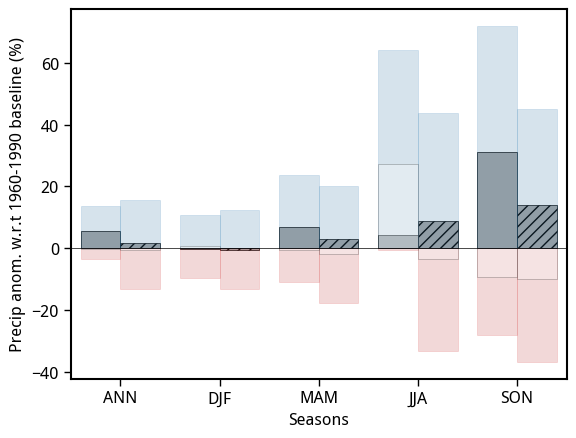

In [104]:
ax = sns.barplot(stack.loc[stack['region'] == 39], x = 'season', y='asymm', hue = 'model', \
                 palette=['darkgray', 'darkgray'], edgecolor='k', linewidth=0.5)
hatches = ['', '/']
draw_hatch(ax, hatches)
ax1 = sns.barplot(stack.loc[stack['region'] == 39], x = 'season', y='nino', hue = 'model', \
                 palette=['tab:red', 'tab:red'], alpha = 0.2, edgecolor='tab:red', linewidth=0.5)
draw_hatch(ax1, hatches)
ax2 = sns.barplot(stack.loc[stack['region'] == 39], x = 'season', y='nina', hue = 'model', \
                 palette=['tab:blue', 'tab:blue'], alpha = 0.2, edgecolor='tab:blue', linewidth=0.5)
draw_hatch(ax2, hatches)
ax3 = sns.barplot(stack.loc[stack['region'] == 39], x = 'season', y='neut', hue = 'model', \
                 palette=['white', 'white'], alpha = 0.3, edgecolor='k', linewidth=0.5)
draw_hatch(ax3, hatches)
            
        
        
# for hatch_pattern, these_bars in zip(hatches, ax2.containers):
#     for this_bar in these_bars:
#         this_bar.set_hatch(3 * hatch_pattern)
# plt.ylim(-10, 40)
plt.legend(labels = [],frameon=False, fontsize=10, loc = 'upper left')
plt.gca().set_xticklabels(['ANN', 'DJF', 'MAM', 'JJA', 'SON'])
plt.ylabel('Precip anom. w.r.t 1960-1990 baseline (%)')
plt.xlabel('Seasons')
plt.axhline(0, lw=0.5, color='k')
plt.savefig('./PhD/prelim_tasks/images/regional/naus_mme_obs_diff.png', dpi=300, bbox_inches='tight')

In [ ]:
import random
random.seed(42)
get_colors = lambda n: ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]
# get_colors(46)

<AxesSubplot:xlabel='season', ylabel='sign_ratio'>

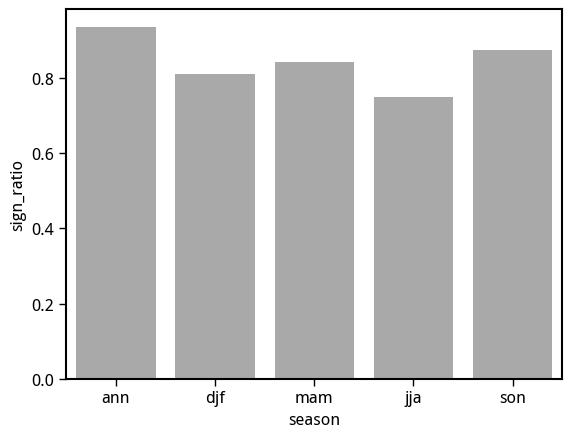

In [292]:
sns.barplot(mme_df.loc[mme_df['region'] == 39], x='season', y='sign_ratio', linewidth=0.5, color='darkgray')
# plt.ylim(0, 1.0)

In [114]:
na_df = out.sel(region = 39).to_dataframe()

In [115]:
na_df['season'] = [i[0] for i in na_df.index]
na_df['model'] = [i[1] for i in na_df.index]
na_df.set_index(np.arange(0,160, 1), inplace=True)

In [116]:
na_df['asymm'] = (na_df['asymm']/na_df['clim'])*100
na_df['enc'] = (na_df['enc']/na_df['clim'])*100
na_df['lnc'] = (na_df['lnc']/na_df['clim'])*100
na_df['nino'] = (na_df['nino']/na_df['clim'])*100
na_df['nina'] = (na_df['nina']/na_df['clim'])*100
na_df['neut'] = (na_df['neut']/na_df['clim'])*100

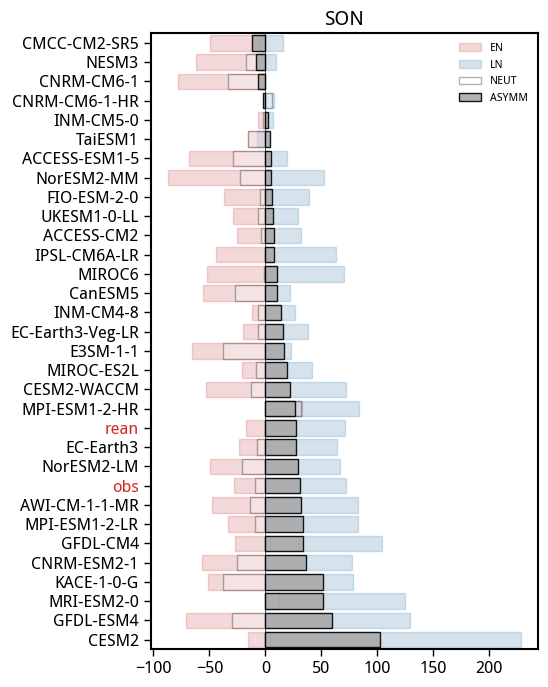

In [120]:
plt.figure(figsize=(5,8))


# plt.subplot(151)
sns.barplot(na_df.loc[na_df['season'] == 'son'].sort_values('asymm'), x = 'nino', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.2, label='EN')
sns.barplot(na_df.loc[na_df['season'] == 'son'].sort_values('asymm'), x = 'nina', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.2, label='LN')
sns.barplot(na_df.loc[na_df['season'] == 'son'].sort_values('asymm'), x = 'neut', y='model', color='white', edgecolor='k', linewidth=1.0, alpha=0.3, label='NEUT')
sns.barplot(na_df.loc[na_df['season'] == 'son'].sort_values('asymm'), x = 'asymm', y='model', color='darkgray', edgecolor='k', linewidth=1.0, alpha=0.9, label='ASYMM')
plt.axvline(0.0, linewidth=0.5, color='k')
plt.ylabel('')
plt.gca().get_yticklabels()[-9].set_color("tab:red")
plt.gca().get_yticklabels()[-12].set_color("tab:red")
plt.xlabel('')
plt.legend(frameon=False, fontsize=8)
plt.title('SON')

# plt.subplot(152)
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('DJF')

# plt.subplot(153)
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('Precip. Anom w.r.t 1960-1990 baseline (%)')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('MAM')

# plt.subplot(154)
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('JJA')

# plt.subplot(155)
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# plt.legend(frameon=False, fontsize=8, loc='lower right')
# plt.title('SON')
plt.savefig('./PhD/prelim_tasks/images/regional/naus_son_model_asymm.png', dpi=300, bbox_inches='tight')

In [125]:
def calc_bias(da, season, region):
    asymm_bias = da.isel(season=season, region=region).asymm - out.isel(season=season, region=region, model=-2).asymm#)/ \
                  #out.isel(season=season, region=region, model=-2).asymm) * 100
    nino_bias = da.isel(season=season, region=region).nino - out.isel(season=season, region=region, model=-2).nino#)/ \
                  #out.isel(season=season, region=region, model=-2).nino) * 100
    nina_bias = da.isel(season=season, region=region).nina - out.isel(season=season, region=region, model=-2).nina#)/ \
                  #out.isel(season=season, region=region, model=-2).nina) * 100
    neut_bias = da.isel(season=season, region=region).neut - out.isel(season=season, region=region, model=-2).neut#)/ \
                  #out.isel(season=season, region=region, model=-2).neut) * 100
    return float(asymm_bias), float(nino_bias)/2, float(nina_bias)/2, float(neut_bias)

In [127]:
a, b, c, d = calc_bias(mme_ds, 0, -9)

In [128]:
(b/a)*100

85.35498209041744

In [129]:
(c/a)*100

-3.4511383713383714

In [130]:
(d/a)*100

-18.096156280920926

In [45]:
naus_jja_obs = out.isel(region=39, model=-2, season=3)
((naus_jja_obs.nino/naus_jja_obs.clim)*100)

<xarray.DataArray ()>
array(-0.57723039)
Coordinates:
    season   <U3 'jja'
    region   int64 39
    model    <U3 'obs'

In [47]:
naus_jja_obs.nino.values

array(-0.02579251)

In [48]:
naus_jja_obs.clim.values

array(4.46832081)